# Introduction

#### This notebook contains some script and utils for preprocessing and visualization.

# Import

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import json 
import torch
import clip
from PIL import Image
import sng_parser
from tqdm import tqdm 
import codecs
import numpy as np
import pickle
from matplotlib import pyplot as plt
import nltk

# Playground

## Visualization

### Contexts

In [4]:
import json
json_path = '/data/mshukor/data/recipe1m/recipe1M/layer1.json'
data = json.load(open(json_path,'r'))

In [22]:
json_path = '/data/mshukor/data/recipe1m/recipe1M/layer2.json'
data_img = json.load(open(json_path,'r'))

In [5]:
json_path = '/data/mshukor/data/recipe1m/recipe1m_13m/ids_1m_filtered.json'
ids = json.load(open(json_path,'r'))

In [3]:
json_path = '/data/mshukor/data/recipe1m/clip_da/layer1_train_ingr_kw.json'
kws1 = json.load(open(json_path,'r'))

In [9]:
json_path = '/data/mshukor/data/recipe1m/clip_da/layer1_recipe1m_13m_train_titles_kw.json'
kws2 = json.load(open(json_path,'r'))

In [20]:
id_to_data = {}
for d in tqdm(data):
    id_to_data[d['id']] = d

100%|██████████| 1029720/1029720 [00:00<00:00, 1103468.95it/s]


In [25]:
id_to_data_img = {}
for d in tqdm(data_img):
    id_to_data_img[d['id']] = d

100%|██████████| 402760/402760 [00:00<00:00, 1127140.88it/s]


In [ ]:
list(id_to_data_img.keys())[:50]

['grilled tandoori chicken wings with coriander yogurt', 'tandoori touchdown wings with mint-mango chutney recipe harvardcommon', 'tandoori-style grilled chicken wings', 'tamarind-chipotle chicken wings', 'indian style chicken wings']
#######################################
{'ingredients': [{'text': '3 pounds Chicken Wings Or Drummettes'}, {'text': '1 teaspoon Salt, Or To Taste'}, {'text': '1/2 teaspoons Pepper Or To Taste'}, {'text': '1 Tablespoon Oil'}, {'text': '3 Tablespoons Butter'}, {'text': '1/4 cups Sriracha Hot Sauce'}, {'text': '2 Tablespoons Honey'}, {'text': '1 Tablespoon Rice Wine Or Sherry'}, {'text': '1 teaspoon Soy Sauce'}, {'text': '1 teaspoon Hoisin Sauce'}, {'text': '1/2 teaspoons Salt'}, {'text': '2 Tablespoons Chopped Cilantro'}], 'url': 'http://tastykitchen.com/recipes/main-courses/honey-sriracha-chicken-wings/', 'partition': 'train', 'title': 'Honey Sriracha Chicken Wings', 'id': '00059b093b', 'instructions': [{'text': 'Preheat oven to 400 degrees F.'}, {'text': 

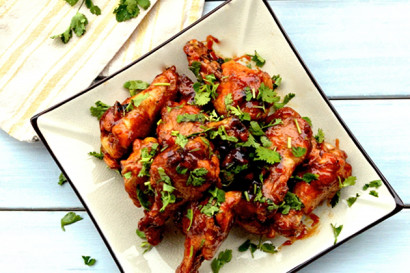

In [62]:
id_ = '00059b093b'
print(kws2[id_])
print("#######################################")
print(id_to_data[id_])
print("#######################################")

imgs = id_to_data_img[id_]
id_img = imgs['images'][0]['id']
path = '/data/mshukor/data/recipe1m/recipe1M/images/train/'+ '/'.join(id_img[:4]) + '/' + id_img 
print(kws1[path])
print("#######################################")

Image.open(path)

In [ ]:
print(len(kws2))
index = 0
print(kws2[index])
Image.open(kws2[index]['image'])


In [ ]:
import lmdb 
import pickle


def encode(value):
    return pickle.dumps(value)

def decode(bytes_value):
    return pickle.loads(bytes_value)

def get(index, env):
    buf = env.get(encode(index))
    value = decode(bytes(buf))
    return value
    
    
ids_path = '/data/mshukor/data/recipe1m/data_lmdb/test/ids.lmdb'

file = lmdb.open(ids_path, readonly=True, lock=False)
tmp = file.begin(write=False, buffers=True)
lmdb_cursor = tmp.cursor()

# id_list = {}
split = 'test'
for k, v in tqdm(lmdb_cursor):
    if split in id_list:
        id_list[split].append(decode(v))
    else:
        id_list[split] = []
        id_list[split].append(decode(v))

In [ ]:
id_list['train'] = []
eval_ids = id_list['test'] + id_list['val']
for d in tqdm(data3):
    id_ = d['id']
    if id_ not in eval_ids: 
        id_list['train'].append(id_)

In [3]:
json_path = '/data/mshukor/data/recipe1m/clip_da/layer1_test_titles_kw.json'
data = json.load(open(json_path,'r'))

In [ ]:
list(data.keys())[:10]

['winter squash soup with gruyere croutons', 'pumpkin soup with sage croutons', 'pumpkin soup with parmesan croutons', 'pumpkin-coconut chowder with shrimp', 'pumpkin soup with ginger croutons']


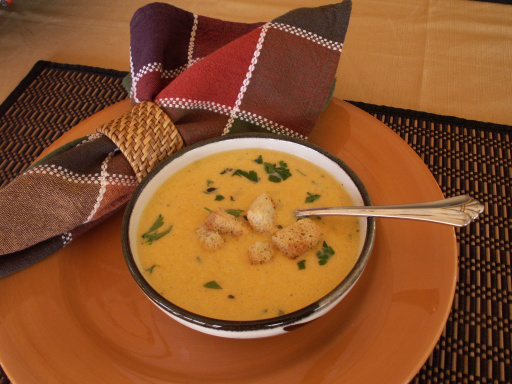

In [6]:
path = '/data/mshukor/data/recipe1m/recipe1M/images/test/7/c/d/4/7cd4a0f1a1.jpg'
print(data[path])
Image.open(path)

## Filter layer1_keywords after sgp

In [69]:
json_path = '/data/mshukor/data/recipe1m/clip_da/keywords/layer1_keywords.json'
data = json.load(open(json_path,'r'))

In [70]:
import nltk
nltk.tokenize.word_tokenize('tablespoon')
# data
new_list = set()
for d in tqdm(data):
    ds = nltk.tokenize.word_tokenize(d)
    for i in ds:
        new_list.add(i)

100%|██████████| 55986/55986 [00:04<00:00, 13737.25it/s]


In [71]:
no_integers = [token for token in tqdm(new_list) if  not all(char.isdigit() or char == '.' or char == '-' for char in token)]

100%|██████████| 10101/10101 [00:00<00:00, 1271279.62it/s]


In [72]:
no_small = [token for token in tqdm(no_integers) if len(token) > 2]
no_large = [token for token in tqdm(no_small) if len(token) < 15]


100%|██████████| 9863/9863 [00:00<00:00, 2839677.40it/s]


In [73]:
## remove noise
to_filter = ['px', ':', '.', '-']
no_noise = []
for token in tqdm(no_large):
    for char in to_filter:
        token = token.replace(char,'')
    no_noise.append(token.replace(char,''))

100%|██████████| 9840/9840 [00:00<00:00, 694510.00it/s]


In [76]:
output_path = '/data/mshukor/data/recipe1m/clip_da/keywords/layer1_keywords_filtered.json'
with open(output_path, 'w') as f:
    json.dump(no_noise, f)

## Visualize retrieval

In [7]:
dir_path = '/data/mshukor/logs/recipe1m/vlpcook_clip_finetune/'

im2recipe_path = os.path.join(dir_path, 'im2recipe.npy')
recipe2im_path = os.path.join(dir_path, 'recipe2im.npy')

saved_ids_path = os.path.join(dir_path, 'saved_ids')
img_path_path = os.path.join(dir_path, 'img_path')


im2recipe = np.load(im2recipe_path)
recipe2im = np.load(recipe2im_path)

import pickle
with open(saved_ids_path, 'rb') as fp:
    saved_ids = pickle.load(fp)
    
with open(img_path_path, 'rb') as fp:
    img_path = pickle.load(fp)

In [8]:
new_img_path = []
for j, i in enumerate(img_path):
    new_img_path.append(i.replace('home', 'data'))


In [9]:
import json
json_path = '/data/mshukor/data/recipe1m/recipe1M/layer1.json'
data = json.load(open(json_path,'r'))

id_to_data = {}
for d in tqdm(data):
    id_to_data[d['id']] = d

100%|██████████| 1029720/1029720 [00:00<00:00, 1267986.17it/s]


In [10]:
json_path = '/data/mshukor/data/recipe1m/recipe1M/layer2.json'
data_img = json.load(open(json_path,'r'))

id_to_data_img = {}
for d in tqdm(data_img):
    id_to_data_img[d['id']] = d

100%|██████████| 402760/402760 [00:00<00:00, 1342226.34it/s]


In [ ]:
useful_ids = []
for j, i in enumerate(saved_ids):
    if i in ids_to_index.keys():
        useful_ids.append(j)
print(useful_ids)

### Recipe 2 Image

a23d39367e
{'ingredients': [{'text': '2 eggs'}, {'text': '2 tablespoons sugar'}, {'text': '13 cup olive oil'}, {'text': '2 cups flour'}, {'text': '2 teaspoons baking powder'}, {'text': '12 teaspoon salt'}, {'text': '12 teaspoon cracked black pepper'}, {'text': '1 teaspoon dried basil'}, {'text': '1 teaspoon dried oregano (preferably greek)'}, {'text': '34 cup grated parmesan cheese'}, {'text': '14 cup finely chopped sun-dried tomato'}, {'text': '14 cup finely chopped kalamata olive'}], 'url': 'http://www.food.com/recipe/savoury-mediterranean-biscotti-59869', 'partition': 'test', 'title': 'Savoury Mediterranean Biscotti', 'id': 'a23d39367e', 'instructions': [{'text': 'In large bowl, beat eggs and sugar.'}, {'text': 'Add olive oil until smooth.'}, {'text': 'In bowl, combine flour, baking powder, salt, pepper and basil and oregano.'}, {'text': 'Stir dry ingredients into egg mixture until blended.'}, {'text': 'Stir in cheese, sun-dried tomatoes and olives and combine thoroughly.'}, {'text'

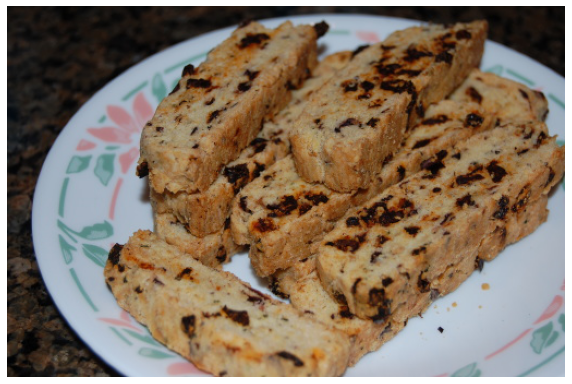

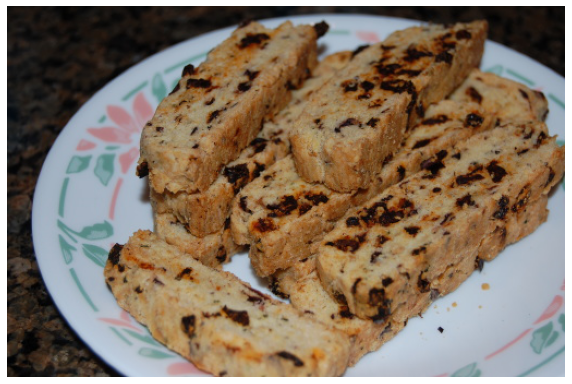

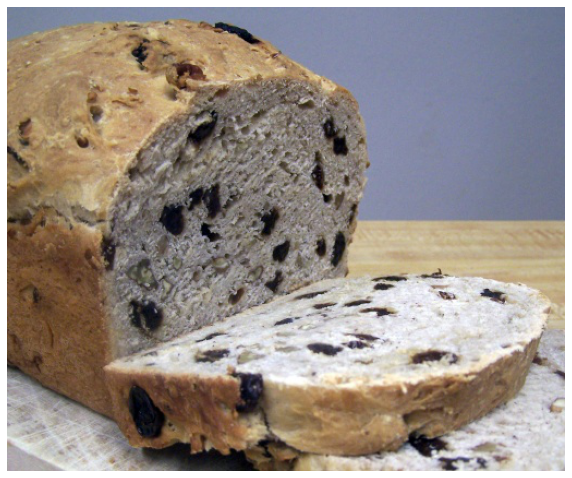

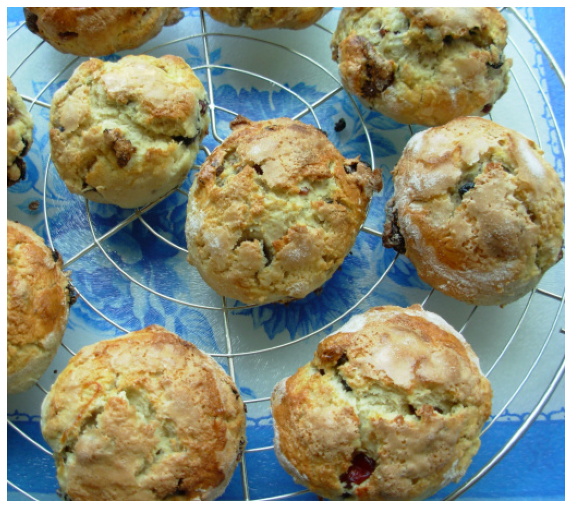

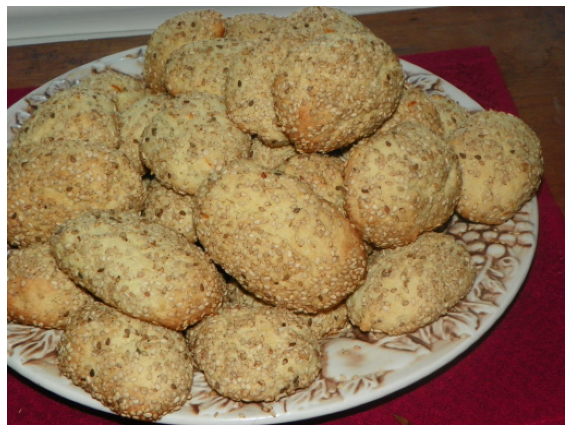

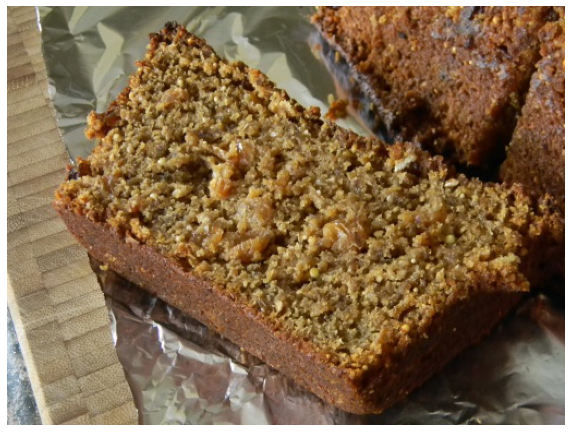

In [16]:
from matplotlib import pyplot as plt

index = 772

# 210, 7, 637, 772
indices_results = recipe2im[index][:5]




recipe_id = saved_ids[index]
# print(ids_to_index[recipe_id])
print(recipe_id)
print(id_to_data[recipe_id])


imgs = id_to_data_img[recipe_id]['images']

id_img = imgs[0]['id']
im_path = '/data/mshukor/data/recipe1m/recipe1M/images/test/'+ '/'.join(id_img[:4]) + '/' + id_img 

im = Image.open(im_path).convert('RGB')

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(im)

for i in indices_results:
    im_path = new_img_path[i]
    print("###########################################3")
    print(id_to_data[saved_ids[i]]['title'])
    im = Image.open(im_path).convert('RGB')
    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.imshow(im)

### Tfood recipe 2 image

In [11]:
dir_path = '/data/mshukor/logs/recipe1m/TFood/'

im2recipe_path = os.path.join(dir_path, 'im2recipe.npy')
recipe2im_path = os.path.join(dir_path, 'recipe2im.npy')

saved_ids_path = os.path.join(dir_path, 'saved_ids')
img_path_path = os.path.join(dir_path, 'img_path')


im2recipe_tfood = np.load(im2recipe_path)
recipe2im_tfood = np.load(recipe2im_path)

import pickle
with open(saved_ids_path, 'rb') as fp:
    saved_ids_tfood = pickle.load(fp)
    
with open(img_path_path, 'rb') as fp:
    img_path_tfood = pickle.load(fp)

In [12]:
ids_to_index = {}

for i, d in enumerate(saved_ids_tfood):
    ids_to_index[d] = i

new_img_path_tfood = []
for j, i in enumerate(img_path_tfood):
    new_img_path_tfood.append(i.replace('home', 'data'))

In [34]:
ids_to_index['b039a28bfc']

250

In [18]:
recipe_id

'2c46bdc215'

a04f5515f2
{'ingredients': [{'text': '4 chicken breast halves'}, {'text': '8 slices provolone cheese or 8 slices mozzarella cheese'}, {'text': '8 ounces favorite barbecue sauce'}, {'text': '8 kaiser rolls or 8 hamburger buns'}, {'text': '8 slices lettuce'}, {'text': '8 slices tomatoes'}, {'text': '8 slices cooked bacon (optional)'}], 'url': 'http://www.food.com/recipe/barbecued-chicken-sandwiches-165249', 'partition': 'test', 'title': 'Barbecued Chicken Sandwiches', 'id': 'a04f5515f2', 'instructions': [{'text': 'Pound each chicken thin -- this helps it to cook quickly, evenly and doubles size of chicken.'}, {'text': 'Cut chicken in half to make 8 pieces.'}, {'text': 'Heat grill to medium and cook chicken with barbecue sauce brushed on it, turning and adding more barbecue sauce until done.'}, {'text': 'I would say about 10 minutes.'}, {'text': 'Top each piece with cheese, turn off grill and cover for a few minutes to melt.'}, {'text': 'Can also place rolls on grill to toast also.'}, {'t

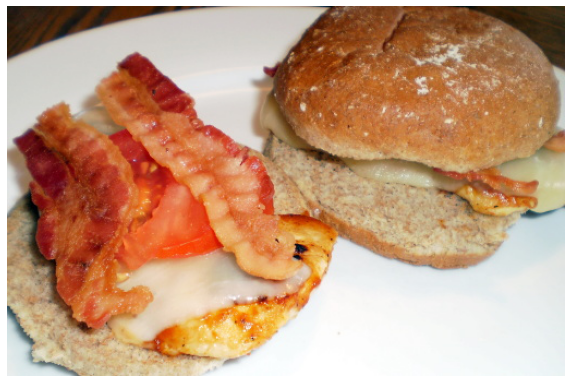

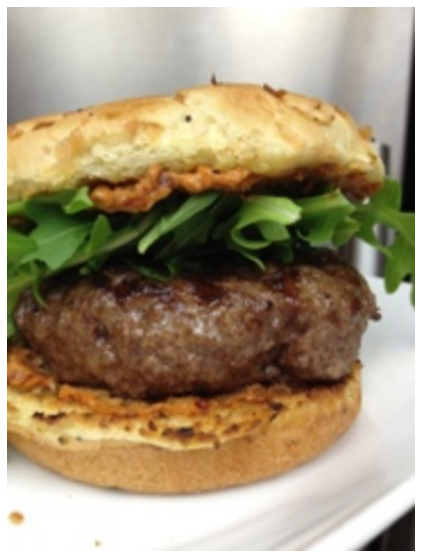

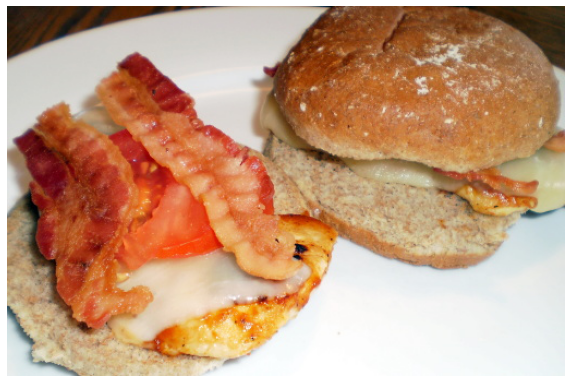

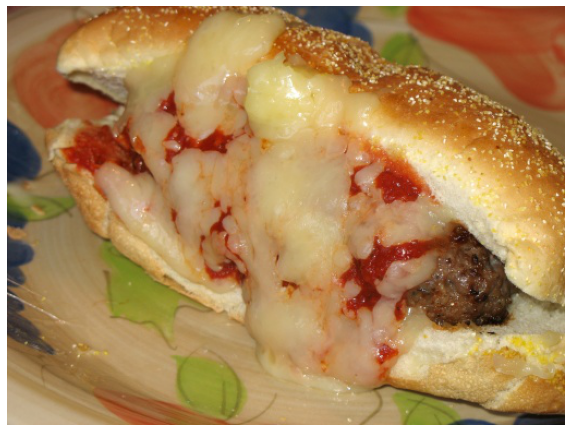

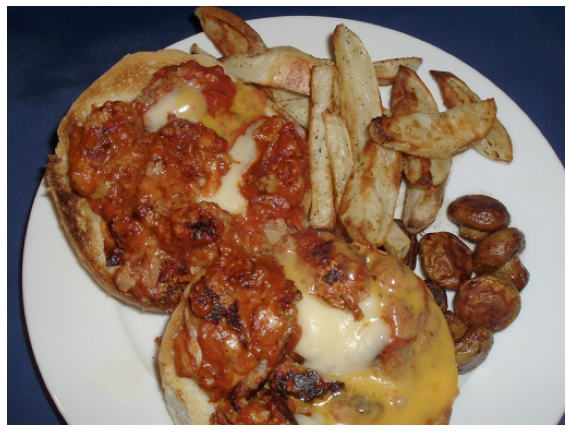

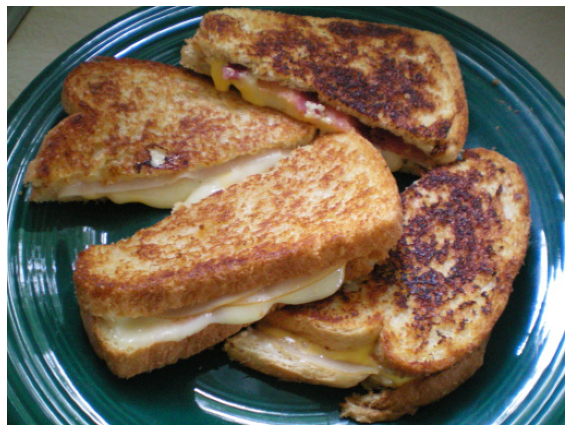

In [14]:
from matplotlib import pyplot as plt

index = 38

# 762, 38, 250, 499
indices_results = recipe2im_tfood[index][:5]




recipe_id = saved_ids_tfood[index]

print(recipe_id)
print(id_to_data[recipe_id])


imgs = id_to_data_img[recipe_id]['images']

id_img = imgs[0]['id']
im_path = '/data/mshukor/data/recipe1m/recipe1M/images/test/'+ '/'.join(id_img[:4]) + '/' + id_img 

im = Image.open(im_path).convert('RGB')

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(im)

for i in indices_results:
    im_path = img_path_tfood[i]
    im = Image.open(im_path).convert('RGB')
    print("###########################################3")
    print(id_to_data[saved_ids_tfood[i]]['title'])
    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.imshow(im)

## Recipe Intervention 

In [4]:
from recipe1m.models import networks
from bootstrap.lib.options import Options
from recipe1m.datasets.factory import factory_recipe1m
from bootstrap.datasets import transforms as transforms_bootstrap

import torch.nn.functional as F

device = "cuda" if torch.cuda.is_available() else "cpu"


In [5]:

config = '/home/mshukor/tfood/recipe1m/options/vlpcook_clip_finetune.yaml'
# config = '/home/mshukor/tfood/recipe1m/options/tfood_tfoodvicha_ttl_ingr_lastcataux_auxkwenc_clipvit_vlp_init_noimgproj_keepall.yaml'

pretrained = '/data/mshukor/logs/recipe1m/vlpcook_clip_finetune/ckpt_best_eval_epoch.metric.recall_at_1_im2recipe_mean_model.pth.tar'
# pretrained = '/data/mshukor/logs/recipe1m/tfood_tfoodvicha_ttl_ingr_lastcataux_auxkwenc_clipvit_vlp_init_onlytext_nobert_rec13m/ckpt_best_eval_epoch.metric.recall_at_1_im2recipe_mean_model.pth.tar'


Options(source=config, run_parser=False)
opt_all = Options()

### Model

In [16]:
opt_all['model.network.bert_config'] = '/home/mshukor/tfood/recipe1m/models/networks/recipe_networks/config_bert.json'

In [17]:
network = networks.TfoodViCHA(
    opt_all['model.network'],
    opt_all['dataset.nb_classes'],
    with_classif=opt_all['model.with_classif'], opt_all=opt_all)

[I 2022-10-28 08:03:02] ...e_networks/networks.py.203: Loading CLIP Visual model...
[I 2022-10-28 08:03:10] ...e_networks/networks.py.145: cuda
Vocab size: 199438
[I 2022-10-28 08:03:12] ...networks/tfood_vicha.py.49: Load VCs encoder...


In [18]:
if pretrained is not None:
    state_dict = torch.load(pretrained, map_location='cpu')
    msg = network.load_state_dict(state_dict['network'], strict=False)
    print(msg)
    print(state_dict.keys())

<All keys matched successfully>
dict_keys(['network', 'criterions', 'metrics'])


In [19]:
network.to(device)
network.eval()
print(device)

cuda


### Data

In [6]:
opt_all['dataset']['eval_split'] = 'test'
opt_all['dataset']['batch_size'] = 1

In [7]:
dataset = factory_recipe1m(opt_all['dataset']['eval_split'])

[W 2022-10-28 08:00:51] ...bootstrap/lib/logger.py.98: No logs files will be created (dir_logs attribute is empty)
[I 2022-10-28 08:00:51] ...m/datasets/recipe1m.py.152: Load VCs...
[I 2022-10-28 08:00:53] ...m/datasets/recipe1m.py.165: randkw_p... None


In [8]:
batch_loader = dataset.make_batch_loader()

[I 2022-10-28 08:02:16] ...m/datasets/recipe1m.py.384: Dataset will be sampled with "random" batch_sampler.


In [13]:
test_size = 1000

### Embed Images

In [20]:
@torch.no_grad()
def get_image_embedding(model, batch):
    
    image_feat = model.forward_image(batch, batch, only_feat=True)
    if model.last_cat or model.last_cat_aux:
        image_embed = F.normalize(F.tanh(model.proj_image(image_feat)))
    else:
        image_embed = F.normalize(F.tanh(model.proj_image(image_feat[:, 0, :])))
        
    return image_embed

@torch.no_grad()
def get_recipe_embedding(model, batch):
    
    recipe_embedding = model.recipe_embedding(batch)
    recipe_embed = recipe_embedding[0]
    recipe_embed = F.normalize(F.tanh(model.proj_recipe(recipe_embed))) # avg pooling for text

    return recipe_embed

In [21]:
image_embeddings = []
recipe_embeddings = []
indices = []

index_to_recipe = {}

for i, d in tqdm(enumerate(batch_loader)):
    if d['index'][0] < test_size and d['match'].item() == 1.0:
        if device == 'cuda':
            d = transforms_bootstrap.ToCuda()(d)
        with torch.no_grad():
            image_embed = get_image_embedding(network, d['image'])
            recipe_embed = get_recipe_embedding(network, d['recipe'])
            
        image_embeddings.append(image_embed)
        recipe_embeddings.append(recipe_embed)
        indices.append(d['index'][0])
        
        index_to_recipe[d['index'][0]] = d['recipe']
        

143it [00:01, 115.82it/s]/data/mshukor/envs/tfood/lib/python3.7/site-packages/torch/nn/functional.py:1628: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
51303it [08:01, 106.56it/s]


In [22]:
image_embedds = torch.cat(image_embeddings, dim=0)
if device == 'cuda':
    image_embedds = image_embedds.cuda()

### Intervention

In [23]:
json_path = '/data/mshukor/data/recipe1m/recipe1M/layer2.json'
data_img = json.load(open(json_path,'r'))

id_to_data_img = {}
for d in tqdm(data_img):
    id_to_data_img[d['id']] = d

100%|██████████| 402760/402760 [00:00<00:00, 1352034.28it/s]


In [24]:
def tokenise_sentence(text, vocab, filter_):
    for f in filter_:
        text = text.replace(f, ' ')
    text = nltk.tokenize.word_tokenize(text)
    tokenized_text = []
    tokenized_text.append(vocab['<start>'])
    for w in text:
        if w in vocab:
            tokenized_text.append(vocab[w])
        else:
            tokenized_text.append(vocab['<unk>'])
            count+=1
    tokenized_text.append(vocab['<end>'])
    return tokenized_text

def tokenise_recipe(d, vocab=None, filter_=None, max_ingrs=20, max_instrs=20, max_ingrs_len=15, max_instrs_len=15):
    new_recipe = d.copy()
    # title
    title = tokenise_sentence(d['title'].lower(), vocab, filter_)
    new_recipe['title'] = torch.LongTensor(title).unsqueeze(0)
    
    
    # ingrds
    ingredients = []
    ingrs = [ing['text'].lower() for ing in d['ingredients']]
    for text in ingrs:
        ingredients.append(tokenise_sentence(text, vocab, filter_))
        
    tokenized_ingrs = ingredients[:max_ingrs]
    tokenized_ingrs = [l[:max_ingrs_len] for l in tokenized_ingrs]
    max_len = max([len(l) for l in tokenized_ingrs])
    tokenized_ingrs = [l + (max_len - len(l))*[0] for l in tokenized_ingrs]    
    new_recipe['ingredients'] = torch.LongTensor(tokenized_ingrs).unsqueeze(0)

    
    
    # instr
    instructions = []
    ingrs = [ing['text'].lower() for ing in d['instructions']]
    for text in ingrs:
        instructions.append(tokenise_sentence(text, vocab, filter_))
        


    tokenized_instrs = instructions[:max_instrs]
    tokenized_instrs = [l[:max_instrs_len] for l in tokenized_instrs]
    max_len = max([len(l) for l in tokenized_instrs])
    tokenized_instrs = [l + (max_len - len(l))*[0] for l in tokenized_instrs]
    new_recipe['instructions'] = torch.LongTensor(tokenized_instrs).unsqueeze(0)

    return new_recipe
        

In [12]:
path_layer1 = '/data/mshukor/data/recipe1m/recipe1M/layer1.json'
with open(path_layer1, 'r') as f:
    layer1 = json.load(f)
layer1_ = {data['id']:data for data in tqdm(layer1)}


vocab_path = '/data/mshukor/data/recipe1m/text/vocab_all.txt'
with open(vocab_path,'rb') as f:
    vocab = pickle.load(f)
        
filter_ = ['-', '_', '/']

100%|██████████| 1029720/1029720 [00:00<00:00, 1273814.56it/s]


In [83]:
# index_to_recipe = {}
# for i, d in tqdm(enumerate(batch_loader)):
#     index_to_recipe[d['index'][0]] = d['recipe']

51303it [06:31, 131.19it/s]


#### modify recipes

In [25]:
index = 500

recipe = index_to_recipe[indices[index]].copy()

original_recipe = recipe.copy()

recipe_id = recipe['layer1']['id'][0]

text_recipe = layer1_[recipe_id]

text_recipe

{'ingredients': [{'text': '2 cloves Garlic, Minced'},
  {'text': '20 slices Pepperoni'},
  {'text': '1/4 teaspoons Dried Oregano'},
  {'text': '1- 1/2 cup Healthy Tomato Pasta Sauce (marinara Is Good)'},
  {'text': '1/2 teaspoons Red Pepper Flakes'},
  {'text': '2 Tablespoons Fresh Basil, Chopped'},
  {'text': '2 teaspoons Olive Oil'},
  {'text': '1- 1/2 pound Chicken Breast Tenderloins'},
  {'text': '1/4 teaspoons Freshly Ground Black Pepper'},
  {'text': '1 cup Reduced Fat Mozzarella Cheese'}],
 'url': 'http://tastykitchen.com/recipes/main-courses/skillet-chicken-with-spicy-pepperoni-sauce/',
 'partition': 'test',
 'title': 'Skillet Chicken with Spicy Pepperoni Sauce',
 'id': '023b3432ce',
 'instructions': [{'text': '1.'},
  {'text': 'Preheat broiler to high.'},
  {'text': '2.'},
  {'text': 'Heat a saucepan over medium-high heat.'},
  {'text': 'Coat pan with cooking spray.'},
  {'text': 'Add garlic and pepperoni; cook 2 minutes or until garlic begins to brown, stirring frequently.'},

In [26]:
new_title = ' '
new_instruction = [{'text': ' '},]
new_ingredients = [{'text': 'pizza.'},
  {'text': 'thon'},]

In [27]:
def replace_elements(recipe, new_title=None, new_instruction=None, new_ingredients=None):
    if new_title:
        recipe['title'] = new_title
    if new_ingredients:
        recipe['ingredients'] = new_ingredients
    if new_instruction:
        recipe['instructions'] = new_instruction
    return recipe
    
new_recipe = replace_elements(text_recipe.copy(), new_title=new_title, new_instruction=new_instruction, new_ingredients=new_ingredients)

In [29]:
tokenized_recipe = tokenise_recipe(new_recipe, vocab=vocab, filter_=filter_)
tokenized_recipe

{'ingredients': tensor([[[167838, 134088, 133918,  59198],
          [167838,  82298,  59198,      0]]]),
 'url': 'http://tastykitchen.com/recipes/main-courses/skillet-chicken-with-spicy-pepperoni-sauce/',
 'partition': 'test',
 'title': tensor([[167838,  59198]]),
 'id': '023b3432ce',
 'instructions': tensor([[[167838,  59198]]])}

In [40]:
list(vocab.keys())
vocab['<unk>']

178987

In [301]:
tokenized_recipe = tokenise_recipe(new_recipe, vocab=vocab, filter_=filter_)

recipe['layer1'] = tokenized_recipe

In [302]:
if device == 'cuda':
    recipe = transforms_bootstrap.ToCuda()(recipe)
recipe_embed = get_recipe_embedding(network, recipe)

In [303]:
def retrieve_images_indices(recipe_embed, image_embeddings, k=10):
    scores = torch.mm(recipe_embed,image_embeddings.t())
    inds = torch.topk(scores, k, dim=1)
    inds = inds.indices
    inds = inds[0].tolist()
    print(inds)
    img_inds = [indices[i] for i in inds]
    
    return img_inds
    
img_indices = retrieve_images_indices(recipe_embed, image_embedds, k=10)

[14733, 5688, 16144, 3767, 8546, 19986, 8438, 12311, 1653, 8408]


In [295]:

# img_indices = retrieve_images_indices(recipe_embeddings[100], image_embedds, k=10)

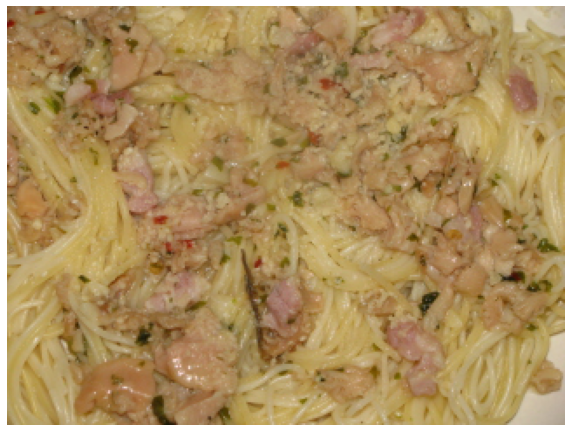

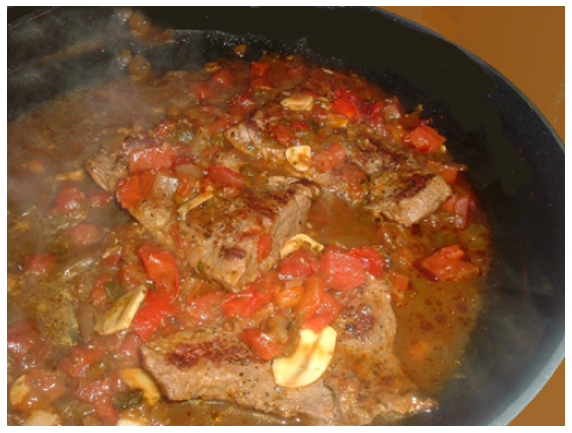

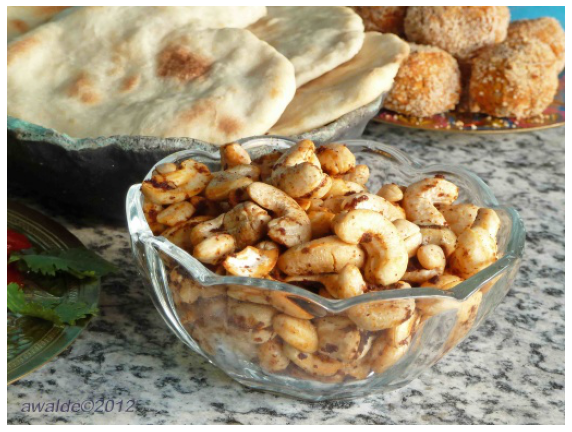

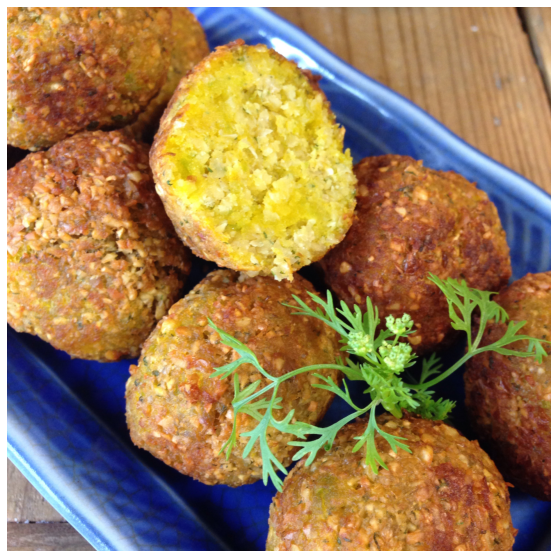

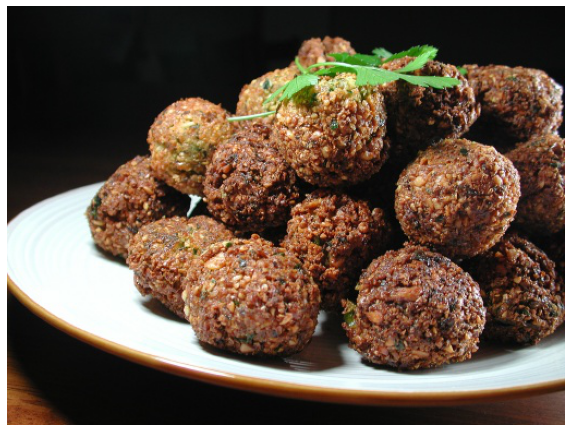

...

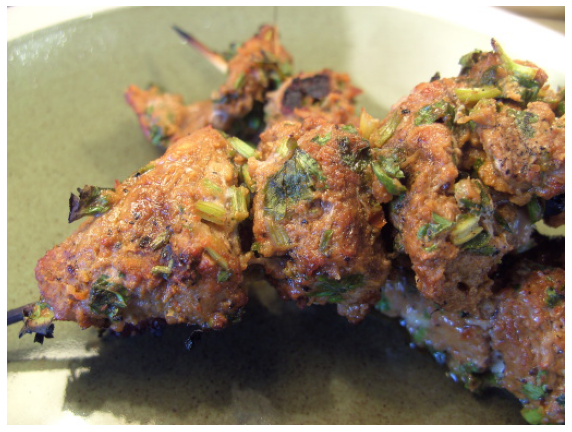

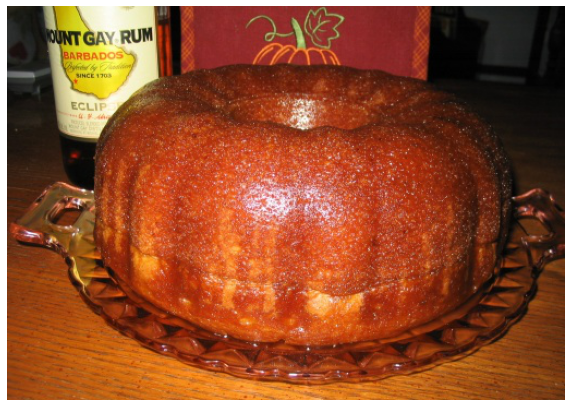

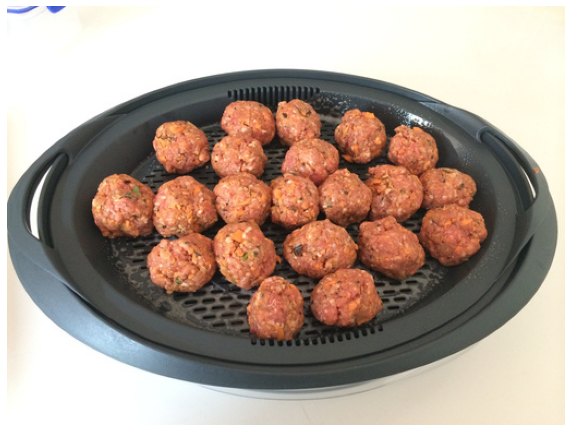

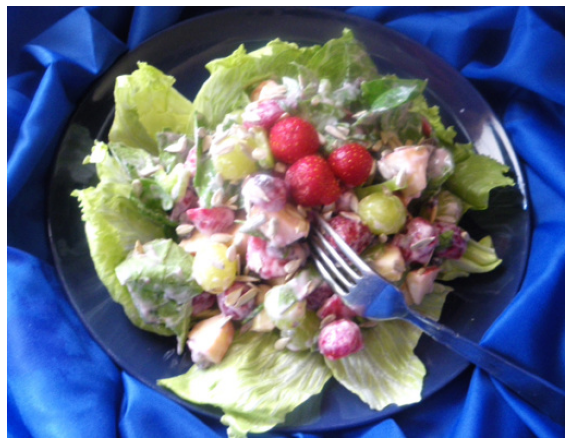

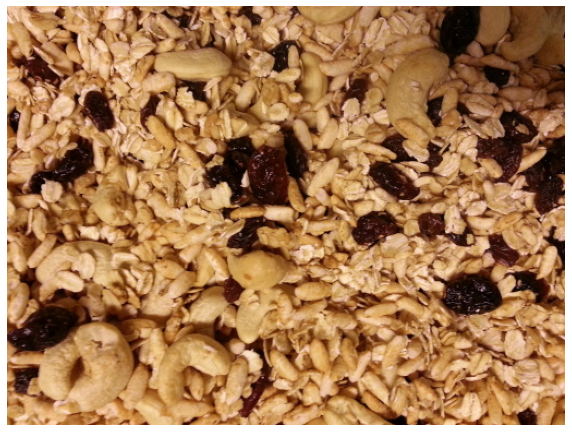

In [304]:
def image_given_recipe_id(id_):
    ids = id_to_data_img[id_]['images']
    id_img = ids[0]['id']
    im_path = '/data/mshukor/data/recipe1m/recipe1M/images/test/'+ '/'.join(id_img[:4]) + '/' + id_img 
    im = Image.open(im_path).convert('RGB')

    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.imshow(im)

def visualize_images(img_indices, id_to_data_img):
    for img_index in img_indices:
        id_ = index_to_recipe[img_index]['ids'][0]
        ids = id_to_data_img[id_]['images']
        id_img = ids[0]['id']
        im_path = '/data/mshukor/data/recipe1m/recipe1M/images/test/'+ '/'.join(id_img[:4]) + '/' + id_img 
        im = Image.open(im_path).convert('RGB')
        
        plt.figure(figsize=(10,10))
        plt.axis('off')
        plt.imshow(im)
    

image_given_recipe_id('2137d4f878')

visualize_images(img_indices, id_to_data_img)